In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
# Set max columns to display
pd.set_option('display.max_columns', None)

In [6]:
#df_outlierHandling = pd.read_csv('/workspaces/codespaces-jupyter/Final Machine/Interpolated LIMS/df_outlierHandling.csv')

df_outlierHandling = pd.read_csv(r"C:\Users\saust\OneDrive\Desktop\GitRepo\Project-OptiC4\1 Preprocess\Continuous Data\adjusted_Limits.csv")

# Print descriptive statistics for df_outlierHandling
df_outlierHandling.describe()

,425 %Al,Butanol,DI55102,DI55152,DI55580,FC42428,FC55003,FC55552,FC55569,FC55576,FFC55553,FFC55555,LC52572,LC55553,LC55555,LC55557,LC55568,LC90366,LC90368,PI55004,PI55020,TC55552,TC55553,TC55555
count,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,6.489900e+04,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000,64899.000000
mean,6.131443,11.710850,0.926903,0.941420,0.995660,35004.980978,5.949903e+03,35412.464156,6616.324857,382.007947,0.991090,0.773585,62.985503,63.448687,58.347415,69.760584,40.780727,46.892832,38.590479,2.351391,-1.404797,167.963618,181.665309,181.038032
std,0.347522,15.671225,0.068814,0.041277,0.050534,6260.874767,1.038822e+03,5497.740319,483.913529,261.840597,0.059842,0.026676,3.167406,7.009572,10.493980,3.252506,2.827524,27.756188,20.480352,1.328582,1.134191,15.898895,28.868411,1.823016
min,0.155707,0.000000,0.000000,0.000000,0.000000,0.164385,1.930000e-17,7377.560000,0.000000,0.000000,0.042564,0.000000,0.000000,0.000000,0.000000,0.000000,1.270380,0.000000,0.006367,0.000000,-5.655290,108.104000,102.756000,100.587000
25%,5.991825,3.650000,0.888465,0.914465,0.965426,32482.350000,5.370930e+03,34042.850000,6346.035000,207.677000,0.969817,0.759142,61.611900,60.079650,49.821550,67.784000,40.291750,23.865700,22.131400,1.311130,-2.273825,155.534000,160.525500,179.969000
50%,6.138610,5.833330,0.936895,0.937696,0.996114,37390.800000,5.954140e+03,37779.100000,6574.130000,349.901000,0.992460,0.777164,63.281300,65.426200,60.098400,70.111900,41.144800,49.408500,44.517700,2.081620,-1.366900,171.679000,176.362000,180.146000
75%,6.296925,11.702800,0.979357,0.962219,1.029220,39247.950000,6.538325e+03,38967.100000,6827.105000,550.221000,1.018340,0.789951,64.913050,68.135650,67.039250,71.990300,41.549700,72.738050,53.915500,3.171880,-0.412031,180.515000,201.718500,182.059000
max,8.058320,99.950000,1.120200,1.070140,1.165180,49959.600000,1.470590e+04,52000.000000,10503.000000,1472.050000,1.475490,0.998409,87.280300,93.684100,99.818500,90.552700,95.861700,87.901600,81.210800,12.531800,2.692840,207.426000,261.360000,239.332000


In [7]:
num_columns = df_outlierHandling.shape[1]
print("Number of features:", num_columns)

Number of features: 25


In [8]:
# # Assuming df_outlierHandling is your DataFrame
# non_date_columns = df_outlierHandling.columns[df_outlierHandling.columns != 'Date']

# # Drop rows where any value (excluding 'Date') is 0 or less
# df_outlierHandling = df_outlierHandling.drop(df_outlierHandling[(df_outlierHandling[non_date_columns] <= 100).any(axis=1)].index)

# df_outlierHandling



In [9]:
df_outlierHandling['Date'] = pd.to_datetime(df_outlierHandling['Date'])
print(df_outlierHandling.dtypes)

# Output after conversion:
# date_datetime64    datetime64[ns]
# date_object        datetime64[ns]
# dtype: object


Date        datetime64[ns]
425 %Al            float64
Butanol            float64
DI55102            float64
DI55152            float64
DI55580            float64
FC42428            float64
FC55003            float64
FC55552            float64
FC55569            float64
FC55576            float64
FFC55553           float64
FFC55555           float64
LC52572            float64
LC55553            float64
LC55555            float64
LC55557            float64
LC55568            float64
LC90366            float64
LC90368            float64
PI55004            float64
PI55020            float64
TC55552            float64
TC55553            float64
TC55555            float64
dtype: object


Skipping datetime column: Date


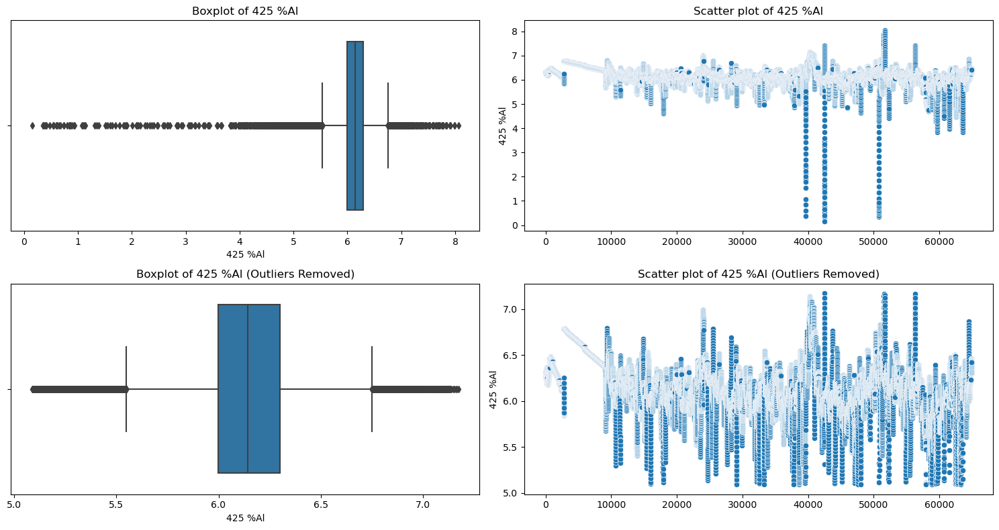

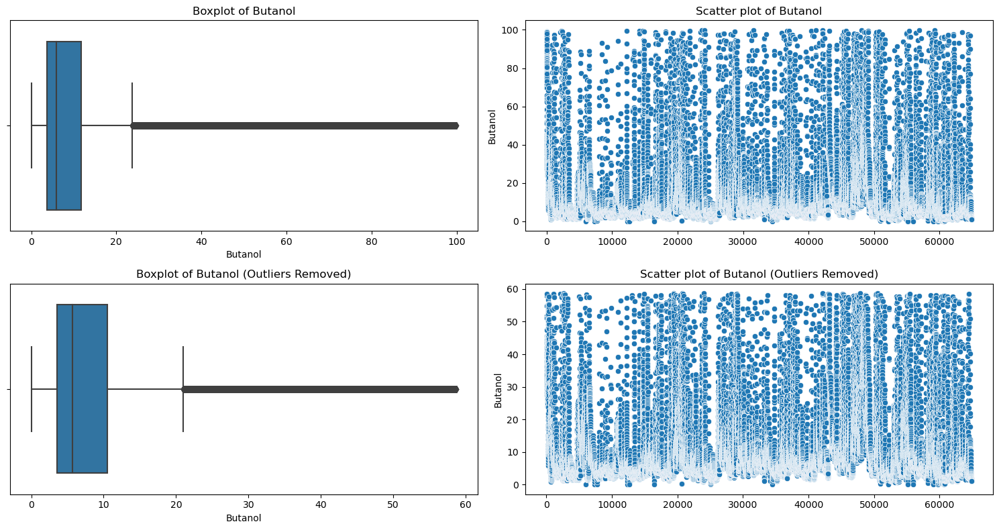

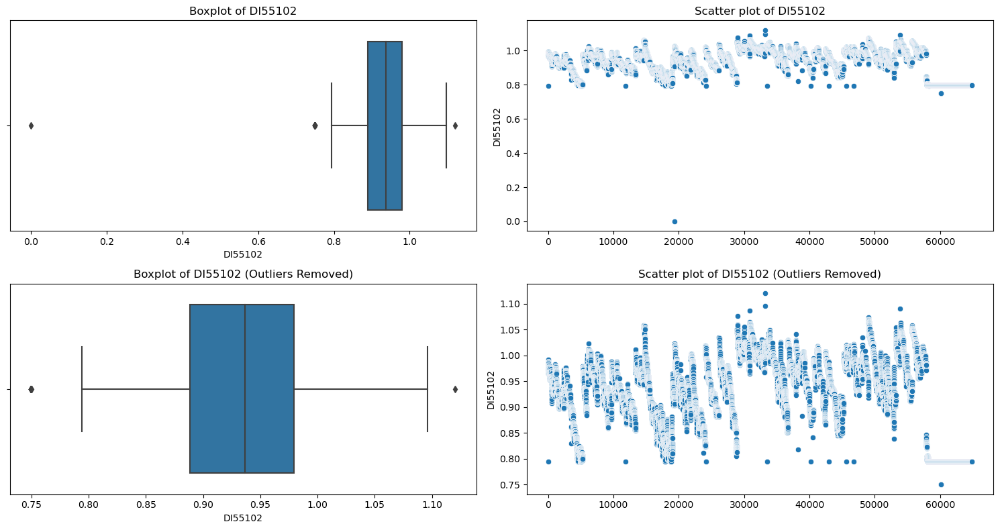

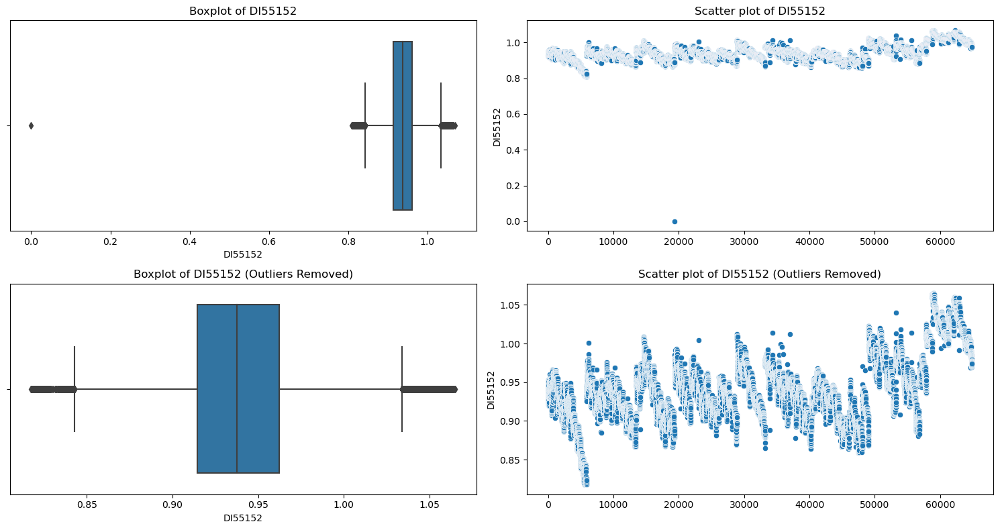

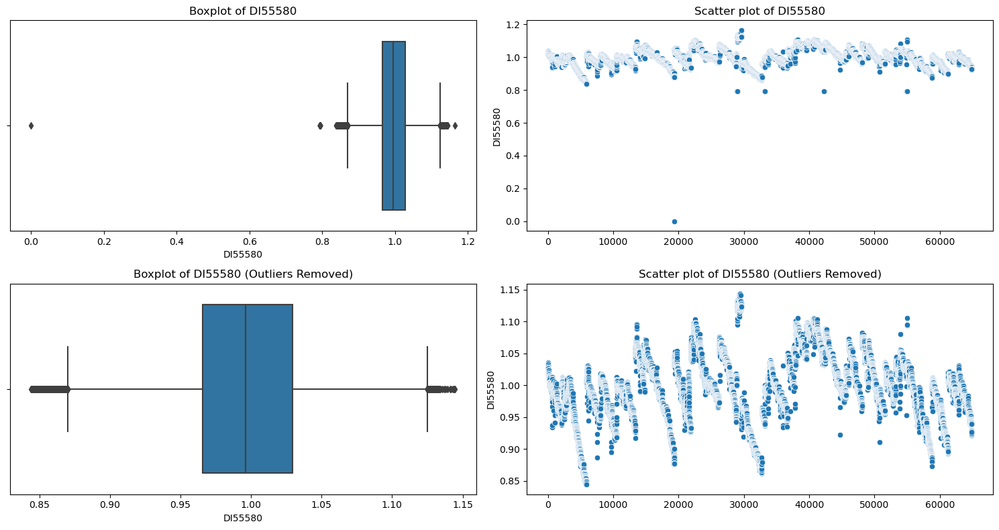

...

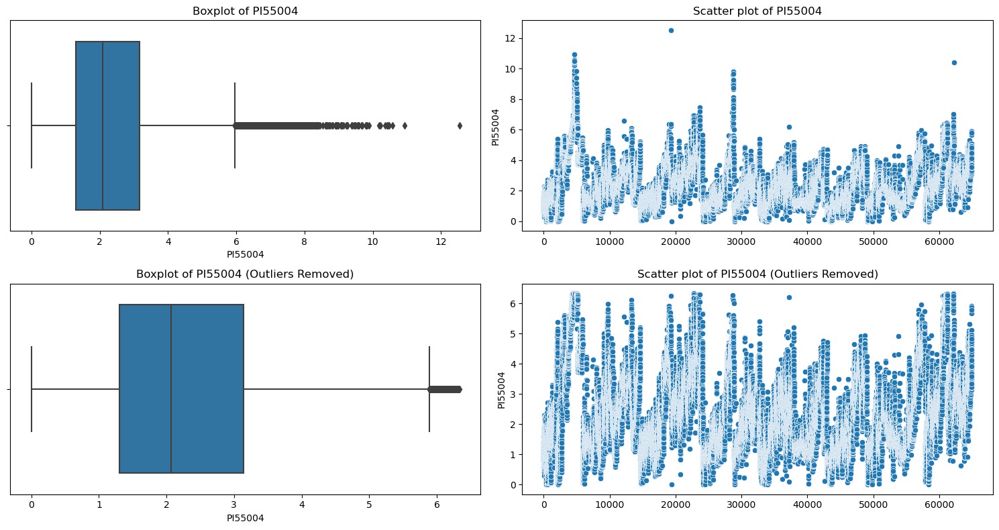

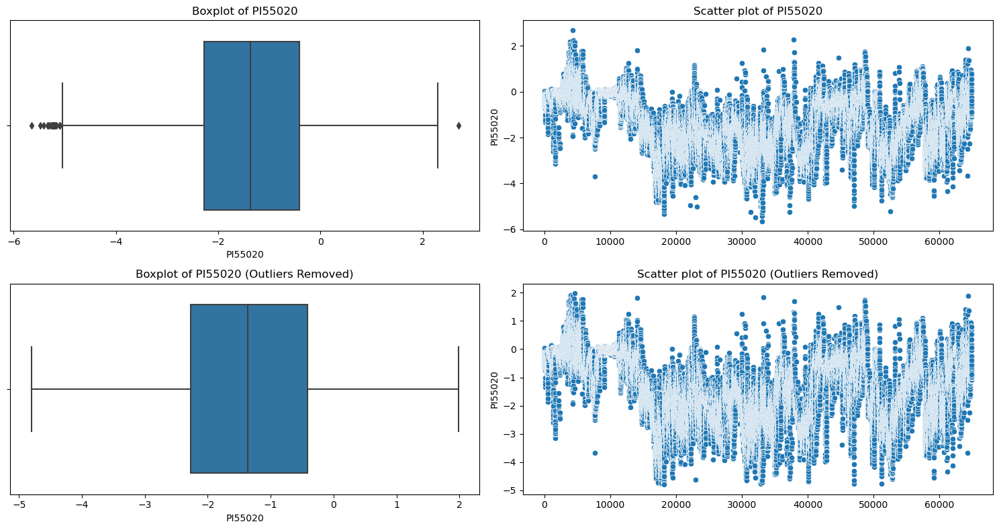

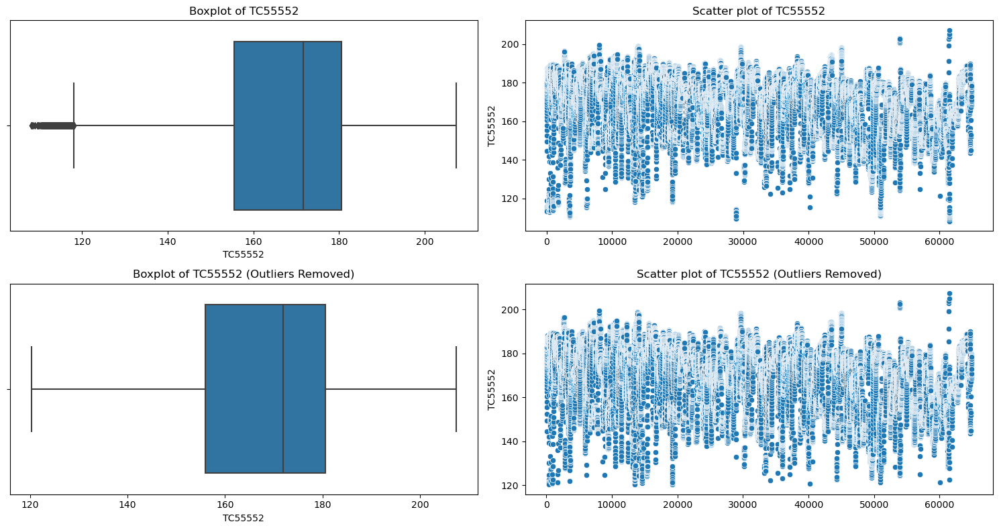

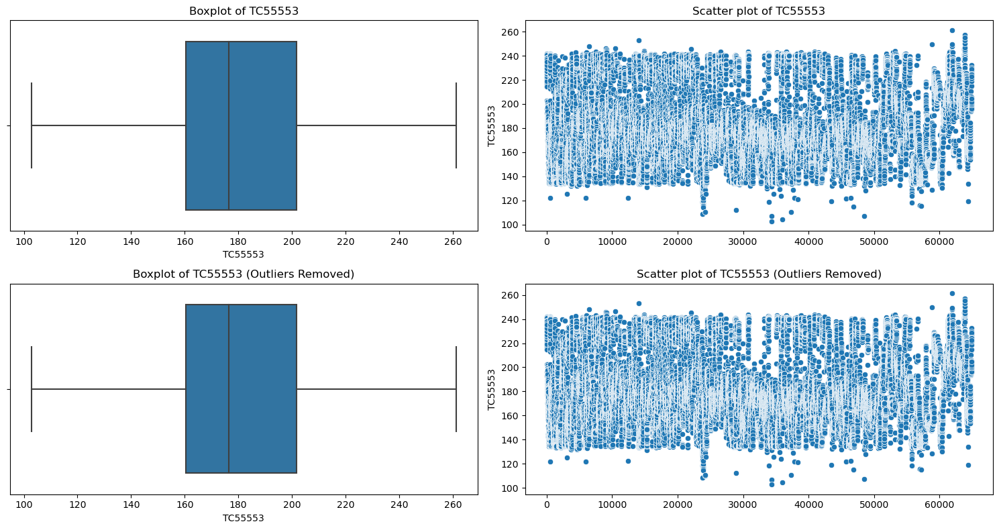

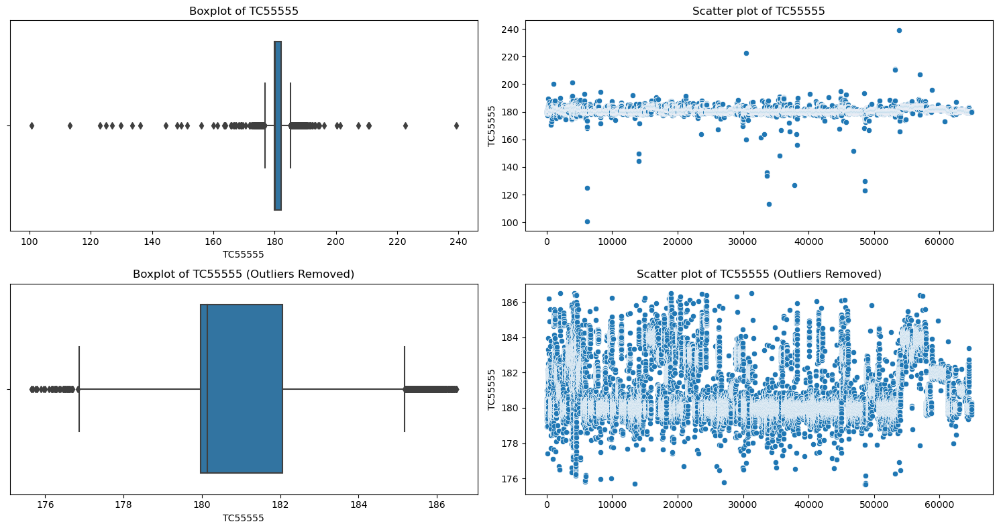

In [10]:

def plot_data(col, data):
    # Check for datetime column
    if pd.api.types.is_datetime64_any_dtype(data[col]):
        print(f"Skipping datetime column: {col}")
        return data[col], None

    # Remove outliers (> 3 standard deviations from the mean)
    mean_col = data[col].mean()
    std_col = data[col].std()
    filtered_col = data[col][((data[col] - mean_col) / std_col).abs() <= 3]

    plt.figure(figsize=(15, 8))

    plt.subplot(2, 2, 1)
    sns.boxplot(x=data[col])
    plt.title(f"Boxplot of {col}")

    plt.subplot(2, 2, 2)
    sns.scatterplot(x=data[col].index, y=data[col])
    plt.title(f"Scatter plot of {col}")

    plt.subplot(2, 2, 3)
    sns.boxplot(x=filtered_col)
    plt.title(f"Boxplot of {col} (Outliers Removed)")

    plt.subplot(2, 2, 4)
    sns.scatterplot(x=filtered_col.index, y=filtered_col)
    plt.title(f"Scatter plot of {col} (Outliers Removed)")

    plt.tight_layout()
    plt.show()

    return data[col], filtered_col

# Initialize dictionaries to store data
df_plotted = {}
df_plotted_Outliers_removed = {}

# Loop through each column to plot the data
for col in df_outlierHandling.columns:
    plotted, plotted_filtered = plot_data(col, df_outlierHandling)
    df_plotted[col] = plotted
    if plotted_filtered is not None:
        df_plotted_Outliers_removed[col] = plotted_filtered

# Convert the dictionaries to DataFrames
df_plotted = pd.DataFrame(df_plotted)
df_plotted_Outliers_removed = pd.DataFrame(df_plotted_Outliers_removed)

# Ensure "Date" column is present in df_plotted_Outliers_removed
if "Date" in df_outlierHandling.columns and "Date" not in df_plotted_Outliers_removed.columns:
    df_plotted_Outliers_removed["Date"] = df_outlierHandling["Date"]


In [11]:
# def plot_data(col, data, remove_outliers=False):
#     if pd.api.types.is_datetime64_any_dtype(data[col]):
#         print(f"Skipping datetime column: {col}")
#         return data[col], data[col]  # keep datetime columns as they are

# def plot_data(col, data, remove_outliers=False):
#     if pd.api.types.is_datetime64_any_dtype(data[col]):
#         print(f"Skipping datetime column: {col}")
#         return data[col], None  # keep datetime columns as they are

#     # Remove outliers (> 3 standard deviations from the mean)
#     mean_col = data[col].mean()
#     std_col = data[col].std()
#     filtered_col = data[col][((data[col] - mean_col) / std_col).abs() <= 3]

#     plt.figure(figsize=(15, 8))

#     plt.subplot(2, 2, 1)
#     sns.boxplot(x=data[col])
#     plt.title(f"Boxplot of {col}")

#     plt.subplot(2, 2, 2)
#     sns.scatterplot(x=data[col].index, y=data[col])
#     plt.title(f"Scatter plot of {col}")

#     plt.subplot(2, 2, 3)
#     sns.boxplot(x=filtered_col)
#     plt.title(f"Boxplot of {col} (Outliers Removed)")

#     plt.subplot(2, 2, 4)
#     sns.scatterplot(x=filtered_col.index, y=filtered_col)
#     plt.title(f"Scatter plot of {col} (Outliers Removed)")

#     plt.tight_layout()
#     plt.show()

#     return data[col], filtered_col

# # Create empty dictionaries to hold the Series
# df_plotted = {}
# df_plotted_Outliers_removed = {}

# # Loop through each column to plot the data
# for col in df_outlierHandling.columns:
#     plotted, plotted_filtered = plot_data(col, df_outlierHandling, remove_outliers=True)
#     df_plotted[col] = plotted
#     if plotted_filtered is not None:
#         df_plotted_Outliers_removed[col] = plotted_filtered

# # Convert the dictionaries to DataFrames
# df_plotted = pd.DataFrame(df_plotted)
# df_plotted_Outliers_removed = pd.DataFrame(df_plotted_Outliers_removed)




In [12]:
df_outlierHandling = df_plotted_Outliers_removed.copy()







In [13]:
# Calculate the statistics for each column in df_outlierHandling
total_rows = len(df_outlierHandling)
non_nan_count = df_outlierHandling.count()
nan_count = df_outlierHandling.isnull().sum()
nan_percentage = (nan_count / total_rows) * 100

# Store these in a DataFrame
nan_stats = pd.DataFrame({
    'ID': df_outlierHandling.columns,
    'total_rows': total_rows,
    'non_nan_count': non_nan_count.values,
    'nan_count': nan_count.values,
    'nan_percentage': nan_percentage.values
})

print(nan_stats)

## Plot
#nan_stats.set_index('ID')['nan_percentage'].plot(kind='bar')
#plt.ylabel('Percentage of NaNs')
#plt.title('Percentage of NaNs in each column')
#plt.show()\

          ID  total_rows  non_nan_count  nan_count  nan_percentage
0    425 %Al       64899          63968        931        1.434537
1    Butanol       64899          62803       2096        3.229634
2    DI55102       64899          64898          1        0.001541
3    DI55152       64899          64785        114        0.175658
4    DI55580       64899          64779        120        0.184903
5    FC42428       64899          64564        335        0.516187
6    FC55003       64899          64052        847        1.305105
7    FC55552       64899          62821       2078        3.201898
8    FC55569       64899          63678       1221        1.881385
9    FC55576       64899          64571        328        0.505401
10  FFC55553       64899          63835       1064        1.639471
11  FFC55555       64899          64572        327        0.503860
12   LC52572       64899          63887       1012        1.559346
13   LC55553       64899          64501        398        0.61

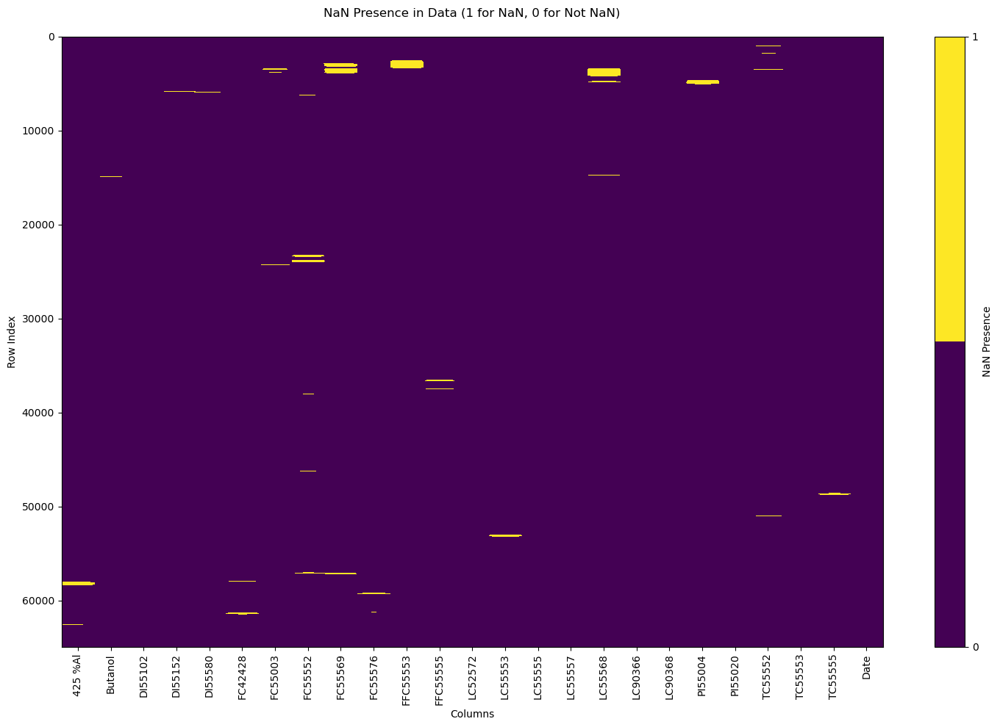

In [14]:


# Create a binary matrix to represent NaNs (1 for NaN, 0 for a number)
nan_matrix = np.where(df_outlierHandling.isna(), 1, 0)

fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the size as needed
cmap = plt.get_cmap('viridis', 2)  # We use a colormap that differentiates between 0 and 1 clearly

# Plotting heatmap
cax = ax.imshow(nan_matrix, cmap=cmap, aspect='auto')

# Adding colorbar for reference
plt.colorbar(cax, ticks=[0, 1], label='NaN Presence')
plt.title("NaN Presence in Data (1 for NaN, 0 for Not NaN)", pad=20)

# To make the columns readable and vertical
plt.xticks(range(df_outlierHandling.shape[1]), df_outlierHandling.columns, rotation=90)  # rotation set to 90 for vertical labels

plt.xlabel('Columns')
plt.ylabel('Row Index')

plt.tight_layout()
plt.show()


In [15]:
df_outlierHandling = df_outlierHandling.dropna().copy()



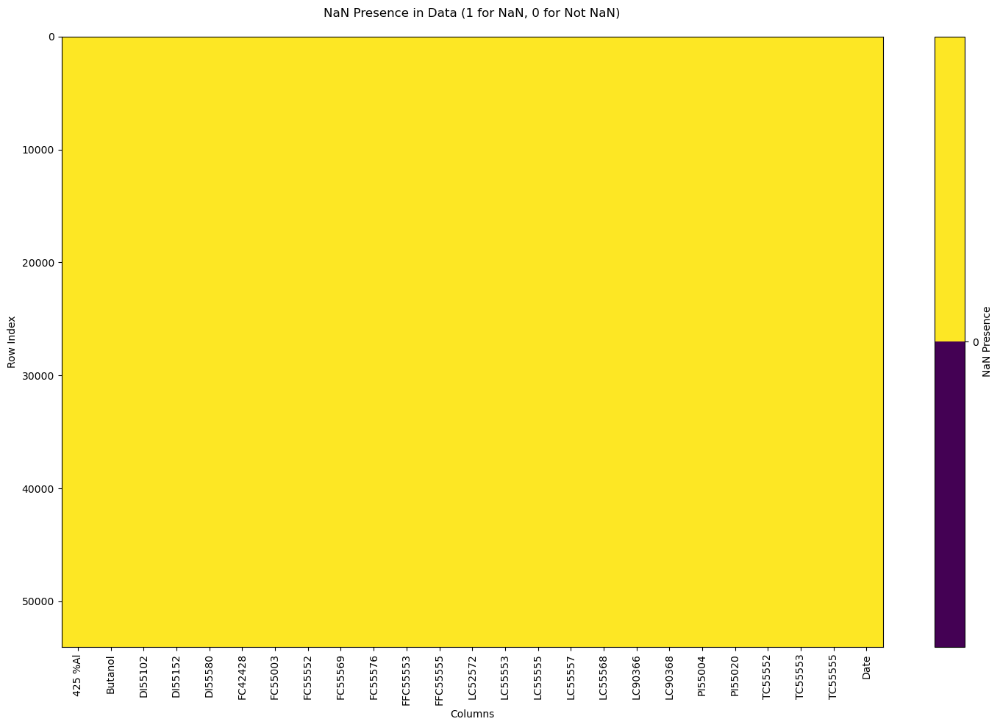

In [16]:


# Create a binary matrix to represent NaNs (1 for NaN, 0 for a number)
nan_matrix = np.where(df_outlierHandling.isna(), 1, 0)

fig, ax = plt.subplots(figsize=(15, 10))  # Adjust the size as needed
cmap = plt.get_cmap('viridis', 2)  # We use a colormap that differentiates between 0 and 1 clearly

# Plotting heatmap
cax = ax.imshow(nan_matrix, cmap=cmap, aspect='auto')

# Adding colorbar for reference
plt.colorbar(cax, ticks=[0, 1], label='NaN Presence')
plt.title("NaN Presence in Data (1 for NaN, 0 for Not NaN)", pad=20)

# To make the columns readable and vertical
plt.xticks(range(df_outlierHandling.shape[1]), df_outlierHandling.columns, rotation=90)  # rotation set to 90 for vertical labels

plt.xlabel('Columns')
plt.ylabel('Row Index')

plt.tight_layout()
plt.show()


In [17]:
# Calculate the statistics for each column in df_outlierHandling
total_rows = len(df_outlierHandling)
non_nan_count = df_outlierHandling.count()
nan_count = df_outlierHandling.isnull().sum()
nan_percentage = (nan_count / total_rows) * 100

# Store these in a DataFrame
nan_stats = pd.DataFrame({
    'ID': df_outlierHandling.columns,
    'total_rows': total_rows,
    'non_nan_count': non_nan_count.values,
    'nan_count': nan_count.values,
    'nan_percentage': nan_percentage.values
})

print(nan_stats)

## Plot
#nan_stats.set_index('ID')['nan_percentage'].plot(kind='bar')
#plt.ylabel('Percentage of NaNs')
#plt.title('Percentage of NaNs in each column')
#plt.show()\

          ID  total_rows  non_nan_count  nan_count  nan_percentage
0    425 %Al       54012          54012          0             0.0
1    Butanol       54012          54012          0             0.0
2    DI55102       54012          54012          0             0.0
3    DI55152       54012          54012          0             0.0
4    DI55580       54012          54012          0             0.0
5    FC42428       54012          54012          0             0.0
6    FC55003       54012          54012          0             0.0
7    FC55552       54012          54012          0             0.0
8    FC55569       54012          54012          0             0.0
9    FC55576       54012          54012          0             0.0
10  FFC55553       54012          54012          0             0.0
11  FFC55555       54012          54012          0             0.0
12   LC52572       54012          54012          0             0.0
13   LC55553       54012          54012          0            

In [18]:
# 54012
# 49239 - All Features

num_columns = df_outlierHandling.shape[1]
print("Number of features:", num_columns)




Number of features: 25


## Add Columns to Describe Butanol and Decanol Content

Binary data must be added after Outlier handleing :) 

In [19]:
# Add new column 'B', with 1 if 'A' > 25, else 0
# df_outlierHandling['C4_Spec'] = np.where(df_outlierHandling['Butanol'] < 62, 1, 0)
# df_outlierHandling['C10_Spec'] = np.where(df_outlierHandling['Decanol'] < 5, 1, 0)

In [20]:
df_outlierHandling.to_csv('contData_clean.csv', index=False)

df_outlierHandling.columns

Index(['425 %Al', 'Butanol', 'DI55102', 'DI55152', 'DI55580', 'FC42428',
       'FC55003', 'FC55552', 'FC55569', 'FC55576', 'FFC55553', 'FFC55555',
       'LC52572', 'LC55553', 'LC55555', 'LC55557', 'LC55568', 'LC90366',
       'LC90368', 'PI55004', 'PI55020', 'TC55552', 'TC55553', 'TC55555',
       'Date'],
      dtype='object')

In [22]:
saoSelect = ['Date', '425 %Al']

fb554Select = ['Date', 'Butanol'] # , 'Decanol', 'Ethanol', 'Hexanol', 'Octanol'

unitSelect = ['Date', 'DI55102', 'DI55152', 'DI55580', 'FC42428',
               'FC55003', 'FC55552', 'FC55569', 'FC55576', 'FFC55553', 'FFC55555',
               'LC52572', 'LC55553', 'LC55555', 'LC55557', 'LC55568', 'LC90366',
               'LC90368', 'PI55004', 'PI55020', 'TC55552', 'TC55553', 'TC55555']

            #   ['Date', 'AYC55580', 'DI55102', 'DI55152', 'DI55580', 'FC42428', 'FC52018',
            #   'FC55003', 'FC55009', 'FC55102', 'FC55152', 'FC55552', 'FC55555', 'FC55569', 
            #   'FC55576', 'FFC55553', 'FFC55555', 'FYC55553', 'II52554', 'LC52572', 'LC55553', 
            #   'LC55555', 'LC55557', 'LC55568', 'LC90366', 'LC90368', 'PI55004', 'PI55020', 
            #   'PI55560', 'TC52015', 'TC55552', 'TC55553', 'TC55555', 'TC55566', 'TI40050', 
            #   'TI52014', 'TI55013', 'TI55014', 'TI55015', 'TI55016', 'TI55017', 'TI55021', 
            #   'TI55023','VI52558B']

df_clean_554 = df_outlierHandling[fb554Select].copy()

df_clean_425 = df_outlierHandling[saoSelect].copy()

df_clean_unit = df_outlierHandling[unitSelect].copy()



df_clean_554.to_csv('cont_554Data_clean.csv', index=False)

df_clean_425.to_csv('cont_425Data_clean.csv', index=False)

df_clean_unit.to_csv('cont_unitData_clean.csv', index=False)